In [1]:
from pip._internal import main
main(["install","progressbar"])

### Importing important Libraries

In [1]:
import progressbar
import time
import os
import struct
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd
import numpy as np
import librosa # for sound processing
import DataCollection as dc # local module

### Getting metadata 

In [ ]:
data = pd.read_csv("UrbanSound8K/metadata/UrbanSound8K.csv")
data.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [ ]:
data.shape[0]

8732

In [ ]:
###data = data.sort_values(by=['fold', 'classID',"fsID"], ascending=[True, True, True])
dataset = np.zeros(shape = (data.shape[0],2),dtype = object)
dataset.shape # dataset is the array in which value will be saved

(8732, 2)

###  Extracting feature from audio file

In [ ]:
bar = progressbar.ProgressBar(maxval=data.shape[0], widgets=[progressbar.Bar('$', '||', '||'), ' ', progressbar.Percentage()])
bar.start()
for i in range(data.shape[0]):
    
    fullpath, class_id = dc.path_class(data,data.slice_file_name[i])
    try:
        X, sample_rate = librosa.load(fullpath, res_type='kaiser_fast')
        mfccs = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)
    except Exception:
        print("Error encountered while parsing file: ", file)
        mfccs,class_id = None, None
    feature = mfccs
    label = class_id
    dataset[i,0],dataset[i,1] = feature,label
    
    bar.update(i+1)
    
    
    

In [ ]:
np.save("dataset_melspectrogram",dataset,allow_pickle=True)

In [ ]:
l = np.load("dataset_melspectrogram.npy")
    

In [ ]:
l.shape

In [ ]:
l[8730,1]

### Real World Data for Example

In [ ]:
X, sample_rate = librosa.load("Children Playing-SoundBible.com-591301488.wav", res_type='kaiser_fast')
mfccs = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)

In [ ]:
mfccs.shape

In [ ]:
l[6561,0].shape

/home/ravisingh/anaconda3/lib/python3.7/site-packages/scipy/io/wavfile.py:273: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


sampling rate:  44100 Hz
bit depth:  16
number of channels:  2
duration:  52.14693877551021  second
number of samples:  2299680
class:  children playing


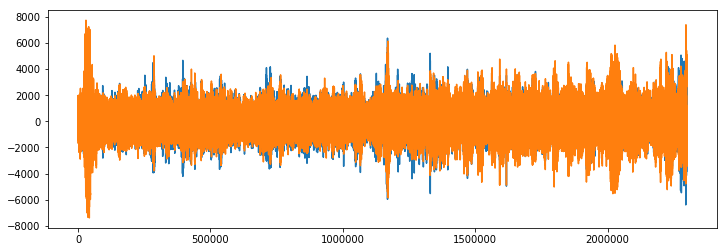

In [3]:
dc.wav_plotter("Real_world_prob.wav","children playing")